# DEPENDENCIES

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt

import statsmodels.api as sm
from statsmodels.tsa.stattools import (
    adfuller,
    arma_order_select_ic,
    grangercausalitytests,
)
from statsmodels.tsa.arima.model import ARIMA

from statsmodels.tsa.vector_ar.vecm import (
    coint_johansen,
    select_order,
    select_coint_rank,
)
from statsmodels.stats.stattools import durbin_watson
from statsmodels.tsa.vector_ar.vecm import VECM

In [2]:
def plot_acf(df, col):
    fig, axes = plt.subplots(2, 2, figsize=(24, 12))
    ax1, ax2, ax3, ax4 = axes.flatten()

    sm.graphics.tsa.plot_acf(df[col].values.squeeze(), lags=20, ax=ax1)
    ax1.set_title(f"{col}: ACF of Original Data")

    sm.graphics.tsa.plot_acf(df[col].diff().dropna().values.squeeze(), lags=20, ax=ax2)
    ax2.set_title(f"{col}: ACF of Differenced Data")

    sm.graphics.tsa.plot_pacf(df[col].values.squeeze(), lags=20, ax=ax3)
    ax3.set_title(f"{col}: PACF of Original Data")
    sm.graphics.tsa.plot_pacf(df[col].diff().dropna().values.squeeze(), lags=20, ax=ax4)
    ax4.set_title(f"{col}: PACF of Differenced Data")

    plt.tight_layout()

    plt.show()

In [3]:
def coin_test(df, prod1, prod2):
    d1 = df[df["product"] == prod1].reset_index(drop=True)
    d2 = df[df["product"] == prod2].reset_index(drop=True)

    df = pd.merge(
        d1[["mid_price"]],
        d2[["mid_price"]],
        how="left",
        left_index=True,
        right_index=True,
        suffixes=(f"_{prod1}", f"_{prod2}"),
    )
    vecm_order = select_order(df, maxlags=10)
    print(vecm_order.summary())

    model = coint_johansen(endog=df, det_order=1, k_ar_diff=1)
    print("Eigen statistic:")
    print(model.eig)
    print("Critical values:")
    d = pd.DataFrame(model.cvt)
    d.rename(columns={0: "90%", 1: "95%", 2: "99%"}, inplace=True)
    print(d)
    print()
    print("Trace statistic:")
    print(pd.DataFrame(model.lr1))

    rank1 = select_coint_rank(df, det_order=1, k_ar_diff=1, method="trace", signif=0.01)
    print(rank1.summary())

    # Perform Granger causality tests
    max_lags = 5
    gc_results = grangercausalitytests(df, max_lags, verbose=True)

    vecm = VECM(
        df, k_ar_diff=1, coint_rank=1, deterministic="n"
    )  # Including a linear trend
    vecm_fit = vecm.fit()

    print(vecm_fit.summary())

    return vecm_fit

# READ DATA

In [4]:
dates = {
    # 1: [-2, -1, 0],
    # 2: [-1, 0, 1],
    # 3: [0, 1, 2],
    4: [1, 2, 3]
}

df = []
for round, days in dates.items():
    for day in days:
        data = pd.read_csv(
            f"C:/Users/edmun/OneDrive/Desktop/2025-IMC-Global-Trading-Challenge/prosperity3bt/resources/round{round}/prices_round_{round}_day_{day}.csv",
            sep=";",
        )
        data["round"] = round

        df.append(data)

data = pd.concat(df)

In [8]:
data.sort_values(by=["round", "day", "timestamp"], ascending=[True, True, True])

,day,timestamp,product,bid_price_1,bid_volume_1,bid_price_2,bid_volume_2,bid_price_3,bid_volume_3,ask_price_1,ask_volume_1,ask_price_2,ask_volume_2,ask_price_3,ask_volume_3,mid_price,profit_and_loss,round
0,1,0,VOLCANIC_ROCK,10515.0,143.0,10514.0,57.0,NaN,NaN,10517,200,NaN,NaN,NaN,NaN,10516.0,0.0,4
1,1,0,PICNIC_BASKET1,58705.0,12.0,58704.0,27.0,NaN,NaN,58716,12,58717.0,27.0,NaN,NaN,58710.5,0.0,4
2,1,0,PICNIC_BASKET2,30252.0,12.0,30251.0,27.0,NaN,NaN,30258,39,NaN,NaN,NaN,NaN,30255.0,0.0,4
3,1,0,VOLCANIC_ROCK_VOUCHER_9500,1015.0,12.0,NaN,NaN,NaN,NaN,1017,12,NaN,NaN,NaN,NaN,1016.0,0.0,4
4,1,0,VOLCANIC_ROCK_VOUCHER_9750,766.0,12.0,NaN,NaN,NaN,NaN,767,12,NaN,NaN,NaN,NaN,766.5,0.0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149995,3,999900,JAMS,6446.0,96.0,6445.0,175.0,NaN,NaN,6447,261,NaN,NaN,NaN,NaN,6446.5,0.0,4
149996,3,999900,CROISSANTS,4295.0,148.0,NaN,NaN,NaN,NaN,4296,62,4297.0,86.0,NaN,NaN,4295.5,0.0,4
149997,3,999900,VOLCANIC_ROCK_VOUCHER_9500,421.0,20.0,NaN,NaN,NaN,NaN,422,20,NaN,NaN,NaN,NaN,421.5,0.0,4
149998,3,999900,VOLCANIC_ROCK,9920.0,137.0,9919.0,69.0,NaN,NaN,9921,131,9922.0,69.0,NaN,NaN,9920.5,0.0,4


In [9]:
#################################### VOLUME METRICS ####################################

# Most Bid Volume - Identifies which bid price has the highest volume.
data["most_bid_volume_idx"] = data[
    ["bid_volume_1", "bid_volume_2", "bid_volume_3"]
].idxmax(axis=1)

# Most Ask Volume - Identifies which ask price has the highest volume.
data["most_ask_volume_idx"] = data[
    ["ask_volume_1", "ask_volume_2", "ask_volume_3"]
].idxmax(axis=1)

# Highest Bid Volume - The highest bid volume across the three bid price levels.
data["most_bid_volume"] = data[["bid_volume_1", "bid_volume_2", "bid_volume_3"]].max(
    axis=1
)

# Highest Ask Volume - The highest ask volume across the three ask price levels.
data["most_ask_volume"] = data[["ask_volume_1", "ask_volume_2", "ask_volume_3"]].max(
    axis=1
)

data["total_bid_volume"] = data[["bid_volume_1", "bid_volume_2", "bid_volume_3"]].sum(
    axis=1
)

data["total_ask_volume"] = data[["ask_volume_1", "ask_volume_2", "ask_volume_3"]].sum(
    axis=1
)

data["volume_ratio"] = data["total_bid_volume"] / data["total_ask_volume"]

data["orderbook_imb"] = (
    (data["total_bid_volume"] - data["total_ask_volume"])
    / (data["total_bid_volume"] + data["total_ask_volume"])
    * 100
)

data["price_impact_sell"] = data["total_bid_volume"] / (
    data["ask_price_1"] - data["bid_price_1"]
)

data["price_impact_buy"] = data["total_ask_volume"] / (
    data["ask_price_1"] - data["bid_price_1"]
)

data["rate_of_bid"] = data.groupby("product")["total_bid_volume"].diff()

data["rate_of_ask"] = data.groupby("product")["total_ask_volume"].diff()


#################################### PRICE METRICS ####################################
# Most Bid Price - Determines the bid price corresponding to the highest bid volume.
data["most_bid"] = np.where(
    data["most_bid_volume_idx"] == "bid_volume_1",
    data["bid_price_1"],
    np.where(
        data["most_bid_volume_idx"] == "bid_volume_2",
        data["bid_price_2"],
        np.where(
            data["most_bid_volume_idx"] == "bid_volume_3", data["bid_price_3"], np.nan
        ),
    ),
)

# Most Ask Price - Determines the ask price corresponding to the highest ask volume.
data["most_ask"] = np.where(
    data["most_ask_volume_idx"] == "ask_volume_1",
    data["ask_price_1"],
    np.where(
        data["most_ask_volume_idx"] == "ask_volume_2",
        data["ask_price_2"],
        np.where(
            data["most_ask_volume_idx"] == "ask_volume_3", data["ask_price_3"], np.nan
        ),
    ),
)

#################################### MID PRICE METRICS ####################################
# Most Mid Price - The mid price of the highest bid and ask prices.
data["most_mid"] = (data["most_ask"] + data["most_bid"]) / 2


#################################### VWAP METRICS ####################################
# Most Micro Price - A weighted average price using both bid and ask volumes.
data["most_micro"] = (
    data["most_ask"] * data["most_bid_volume"]
    + data["most_bid"] * data["most_ask_volume"]
) / (data["most_ask_volume"] + data["most_bid_volume"])

# Micro Price - A weighted average price based on the first bid and ask levels.
data["micro_price"] = (
    data["ask_price_1"] * data["bid_volume_1"]
    + data["bid_price_1"] * data["ask_volume_1"]
) / (data["ask_volume_1"] + data["bid_volume_1"])

# Ask VWAP - The volume-weighted average price for the ask side using the top 3 ask levels.
data["ask_vwap"] = (
    data["ask_price_1"] * data["ask_volume_1"]
    + data["ask_price_2"] * data["ask_volume_2"]
    + data["ask_price_3"] * data["ask_volume_3"]
) / (data["ask_volume_1"] + data["ask_volume_2"] + data["ask_volume_3"])

# Bid VWAP - The volume-weighted average price for the bid side using the top 3 bid levels.
data["bid_vwap"] = (
    data["bid_price_1"] * data["bid_volume_1"]
    + data["bid_price_2"] * data["bid_volume_2"]
    + data["bid_price_3"] * data["bid_volume_3"]
) / (data["bid_volume_1"] + data["bid_volume_2"] + data["bid_volume_3"])

# VWAP Mid - The VWAP midpoint between the ask and bid sides.
data["vwap_mid"] = (data["ask_vwap"] + data["bid_vwap"]) / 2


C:\Users\edmun\AppData\Local\Temp\ipykernel_32196\1818607690.py:6: FutureWarning: The behavior of DataFrame.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  ].idxmax(axis=1)


In [10]:
data.columns

Index(['day', 'timestamp', 'product', 'bid_price_1', 'bid_volume_1',
       'bid_price_2', 'bid_volume_2', 'bid_price_3', 'bid_volume_3',
       'ask_price_1', 'ask_volume_1', 'ask_price_2', 'ask_volume_2',
       'ask_price_3', 'ask_volume_3', 'mid_price', 'profit_and_loss', 'round',
       'most_bid_volume_idx', 'most_ask_volume_idx', 'most_bid_volume',
       'most_ask_volume', 'total_bid_volume', 'total_ask_volume',
       'volume_ratio', 'orderbook_imb', 'price_impact_sell',
       'price_impact_buy', 'rate_of_bid', 'rate_of_ask', 'most_bid',
       'most_ask', 'most_mid', 'most_micro', 'micro_price', 'ask_vwap',
       'bid_vwap', 'vwap_mid'],
      dtype='object')

In [11]:
prices = [
    "mid_price",
    "most_mid",
    "most_micro",
    "micro_price",
    "vwap_mid",
]

# Resin

In [12]:
resin = data[data["product"] == "RAINFOREST_RESIN"].fillna(0)

In [13]:
resin["bid_price_1"].value_counts().sort_index()

bid_price_1
9992.0     25154
9997.0      1920
10000.0      463
10001.0     1365
10002.0      834
10003.0      264
Name: count, dtype: int64

In [14]:
resin["ask_price_1"].value_counts().sort_index()

ask_price_1
9997       293
9998       824
9999      1365
10000      429
10003     1850
10008    25239
Name: count, dtype: int64

max sell @ bid = 9999 because min ask is 9998, sell at bid buy at ask

max buy @ ask = 10_001 because max bid = 10_002, buy at ask sell at bid

## KELP

In [15]:
kelp = data[data["product"] == "KELP"].fillna(0)

In [16]:
kelp

,day,timestamp,product,bid_price_1,bid_volume_1,bid_price_2,bid_volume_2,bid_price_3,bid_volume_3,ask_price_1,...,rate_of_bid,rate_of_ask,most_bid,most_ask,most_mid,most_micro,micro_price,ask_vwap,bid_vwap,vwap_mid
11,1,0,KELP,2032.0,23.0,0.0,0.0,0.0,0.0,2035,...,0.0,0.0,2032.0,2035.0,2033.5,2033.500000,2033.500000,0.0,0.00,0.0
16,1,100,KELP,2034.0,1.0,2033.0,2.0,2032.0,22.0,2035,...,2.0,-1.0,2032.0,2035.0,2033.5,2033.500000,2034.043478,0.0,2032.16,0.0
39,1,200,KELP,2032.0,1.0,2031.0,21.0,0.0,0.0,2035,...,-3.0,0.0,2031.0,2035.0,2033.0,2032.953488,2032.130435,0.0,0.00,0.0
54,1,300,KELP,2034.0,1.0,2032.0,26.0,0.0,0.0,2035,...,5.0,4.0,2032.0,2035.0,2033.5,2033.500000,2034.037037,0.0,0.00,0.0
66,1,400,KELP,2032.0,2.0,2031.0,26.0,0.0,0.0,2035,...,1.0,2.0,2031.0,2035.0,2033.0,2032.925926,2032.200000,0.0,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149938,3,999500,KELP,2037.0,30.0,0.0,0.0,0.0,0.0,2040,...,0.0,-9.0,2037.0,2040.0,2038.5,2038.730769,2038.730769,0.0,0.00,0.0
149952,3,999600,KELP,2037.0,29.0,0.0,0.0,0.0,0.0,2040,...,-1.0,8.0,2037.0,2040.0,2038.5,2038.474576,2038.474576,0.0,0.00,0.0
149956,3,999700,KELP,2037.0,20.0,0.0,0.0,0.0,0.0,2039,...,-9.0,-4.0,2037.0,2040.0,2038.5,2038.500000,2038.538462,0.0,0.00,0.0
149984,3,999800,KELP,2037.0,23.0,0.0,0.0,0.0,0.0,2040,...,3.0,-3.0,2037.0,2040.0,2038.5,2038.500000,2038.500000,0.0,0.00,0.0


In [17]:
sq = data[data["product"] == "SQUID_INK"].reset_index(drop=True)
kelp = data[data["product"] == "KELP"].reset_index(drop=True)

mid_coin = pd.merge(
    sq[["mid_price"]],
    kelp[["mid_price"]],
    how="left",
    left_index=True,
    right_index=True,
    suffixes=("_sq", "_kelp"),
)

In [18]:
coin_test(data, "SQUID_INK", "KELP")

 VECM Order Selection (* highlights the minimums) 
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       0.7319      0.7335       2.079      0.7324
1       0.4754      0.4781       1.609      0.4763
2       0.3809      0.3848       1.464      0.3821
3       0.3375      0.3425       1.401      0.3391
4       0.3166      0.3227       1.372      0.3186
5       0.3038      0.3110       1.355      0.3061
6       0.2957      0.3040       1.344      0.2984
7       0.2915      0.3009       1.338      0.2945
8       0.2879      0.2984       1.334      0.2912
9       0.2864     0.2981*       1.332      0.2902
10     0.2854*      0.2982      1.330*     0.2895*
--------------------------------------------------
Eigen statistic:
[0.00114846 0.00033064]
Critical values:
       90%      95%      99%
0  16.1619  18.3985  23.1485
1   2.7055   3.8415   6.6349

Trace statistic:
           0
0  44.391381
1   9.920196
Johansen cointegration test using

c:\Users\edmun\anaconda3\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


Det. terms outside the coint. relation & lagged endog. parameters for equation mid_price_SQUID_INK
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
L1.mid_price_SQUID_INK     0.0153      0.006      2.555      0.011       0.004       0.027
L1.mid_price_KELP         -0.3595      0.015    -24.296      0.000      -0.389      -0.331
Det. terms outside the coint. relation & lagged endog. parameters for equation mid_price_KELP
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
L1.mid_price_SQUID_INK     0.0078      0.002      3.623      0.000       0.004       0.012
L1.mid_price_KELP         -0.4825      0.005    -90.852      0.000      -0.493      -0.472
        Loading coefficients (alpha) for equation mid_price_SQUID_INK         


In [19]:
vecm = VECM(
    mid_coin, k_ar_diff=1, coint_rank=1, deterministic="n"
)  # Including a linear trend
vecm_fit = vecm.fit()

print(vecm_fit.summary())


Det. terms outside the coint. relation & lagged endog. parameters for equation mid_price_sq
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
L1.mid_price_sq       0.0153      0.006      2.555      0.011       0.004       0.027
L1.mid_price_kelp    -0.3595      0.015    -24.296      0.000      -0.389      -0.331
Det. terms outside the coint. relation & lagged endog. parameters for equation mid_price_kelp
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
L1.mid_price_sq       0.0078      0.002      3.623      0.000       0.004       0.012
L1.mid_price_kelp    -0.4825      0.005    -90.852      0.000      -0.493      -0.472
            Loading coefficients (alpha) for equation mid_price_sq            
                 coef    std err          z    

In [20]:
out = durbin_watson(vecm_fit.resid)
for col, val in zip(mid_coin.columns, out):
    print(col, val)

mid_price_sq 2.0216248292138643
mid_price_kelp 2.2870669208856285


# SQUID INK

In [21]:
squid_ink = data[data["product"] == "SQUID_INK"]

In [22]:
sq = data[data["product"] == "SQUID_INK"].reset_index(drop=True)
kelp = data[data["product"] == "KELP"].reset_index(drop=True)

mid_coin = pd.merge(
    sq[["mid_price"]],
    kelp[["mid_price"]],
    how="left",
    left_index=True,
    right_index=True,
    suffixes=("_sq", "_kelp"),
)

In [23]:
vecm_order = select_order(mid_coin, maxlags=10)
vecm_order.summary()

,AIC,BIC,FPE,HQIC
0,0.7319,0.7335,2.079,0.7324
1,0.4754,0.4781,1.609,0.4763
2,0.3809,0.3848,1.464,0.3821
3,0.3375,0.3425,1.401,0.3391
4,0.3166,0.3227,1.372,0.3186
5,0.3038,0.3110,1.355,0.3061
6,0.2957,0.3040,1.344,0.2984
7,0.2915,0.3009,1.338,0.2945
8,0.2879,0.2984,1.334,0.2912
9,0.2864,0.2981*,1.332,0.2902


In [24]:
model = coint_johansen(endog=mid_coin, det_order=1, k_ar_diff=1)
print("Eigen statistic:")
print(model.eig)
print("Critical values:")
d = pd.DataFrame(model.cvt)
d.rename(columns={0: "90%", 1: "95%", 2: "99%"}, inplace=True)
print(d)
print()
print("Trace statistic:")
print(pd.DataFrame(model.lr1))


Eigen statistic:
[0.00114846 0.00033064]
Critical values:
       90%      95%      99%
0  16.1619  18.3985  23.1485
1   2.7055   3.8415   6.6349

Trace statistic:
           0
0  44.391381
1   9.920196


In [25]:
rank1 = select_coint_rank(
    mid_coin, det_order=1, k_ar_diff=1, method="trace", signif=0.01
)
print(rank1.summary())


Johansen cointegration test using trace test statistic with 1% significance level
r_0 r_1 test statistic critical value
-------------------------------------
  0   2          44.39          23.15
  1   2          9.920          6.635
-------------------------------------


In [26]:
# Perform Granger causality tests
max_lags = 5
gc_results = grangercausalitytests(mid_coin, max_lags, verbose=True)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.1645 , p=0.0008  , df_denom=29996, df_num=1
ssr based chi2 test:   chi2=11.1656 , p=0.0008  , df=1
likelihood ratio test: chi2=11.1635 , p=0.0008  , df=1
parameter F test:         F=11.1645 , p=0.0008  , df_denom=29996, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=296.8796, p=0.0000  , df_denom=29993, df_num=2
ssr based chi2 test:   chi2=593.8582, p=0.0000  , df=2
likelihood ratio test: chi2=588.0564, p=0.0000  , df=2
parameter F test:         F=296.8796, p=0.0000  , df_denom=29993, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=273.0962, p=0.0000  , df_denom=29990, df_num=3
ssr based chi2 test:   chi2=819.4799, p=0.0000  , df=3
likelihood ratio test: chi2=808.4861, p=0.0000  , df=3
parameter F test:         F=273.0962, p=0.0000  , df_denom=29990, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=225.1229

c:\Users\edmun\anaconda3\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


In [27]:
vecm = VECM(
    mid_coin, k_ar_diff=1, coint_rank=1, deterministic="n"
)  # Including a linear trend
vecm_fit = vecm.fit()

print(vecm_fit.summary())


Det. terms outside the coint. relation & lagged endog. parameters for equation mid_price_sq
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
L1.mid_price_sq       0.0153      0.006      2.555      0.011       0.004       0.027
L1.mid_price_kelp    -0.3595      0.015    -24.296      0.000      -0.389      -0.331
Det. terms outside the coint. relation & lagged endog. parameters for equation mid_price_kelp
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
L1.mid_price_sq       0.0078      0.002      3.623      0.000       0.004       0.012
L1.mid_price_kelp    -0.4825      0.005    -90.852      0.000      -0.493      -0.472
            Loading coefficients (alpha) for equation mid_price_sq            
                 coef    std err          z    

In [28]:
out = durbin_watson(vecm_fit.resid)
for col, val in zip(mid_coin.columns, out):
    print(col, ":", val)

mid_price_sq : 2.0216248292138643
mid_price_kelp : 2.2870669208856285


In [29]:
(
    vecm_fit.lin_trend_coint
    + vecm_fit.alpha @ (vecm_fit.beta.T @ mid_coin.iloc[-1].values)
    + vecm_fit.gamma @ (mid_coin.iloc[-1].values - vecm_fit.fittedvalues[-1])
)

array([[-0.10179062, -0.08864819]])

In [30]:
(
    mid_coin.iloc[-1].values
    + vecm_fit.alpha
    @ (vecm_fit.beta.T @ mid_coin.iloc[-2].values + vecm_fit.lin_trend_coint[0])
    + vecm_fit.gamma @ (mid_coin.iloc[-1].values - vecm_fit.fittedvalues[-1])
)

array([1931.39956592, 2038.41126777])

In [31]:
print(vecm_fit.alpha)
print()
print(vecm_fit.beta)
print()
print(vecm_fit.gamma)

[[-6.78270932e-04]
 [ 4.20199636e-05]]

[[ 1.        ]
 [-0.90830378]]

[[ 0.0152894  -0.35953063]
 [ 0.00778033 -0.48251358]]


In [32]:
vecm_fit.predict(steps=1)

array([[1931.47636953, 2038.51891901]])

# PICNIC BASKET 1 

In [33]:
cross = data[data["product"] == "CROISSANTS"]["mid_price"].reset_index(drop=True)
jams = data[data["product"] == "JAMS"]["mid_price"].reset_index(drop=True)
dj = data[data["product"] == "DJEMBES"]["mid_price"].reset_index(drop=True)

picnic1 = data[data["product"] == "PICNIC_BASKET1"].reset_index(drop=True)
picnic1["basket1"] = cross * 6 + jams * 3 + dj
picnic1.rename(columns={"mid_price": "mid_price1"}, inplace=True)
picnic1["prem_disc"] = picnic1["mid_price1"] - picnic1["basket1"]

picnic2 = data[data["product"] == "PICNIC_BASKET2"].reset_index(drop=True)
picnic2["basket2"] = cross * 4 + jams * 2
picnic2.rename(columns={"mid_price": "mid_price2"}, inplace=True)
picnic2["prem_disc"] = picnic2["mid_price2"] - picnic2["basket2"]

In [34]:
(picnic1["ask_price_1"] - picnic1["bid_price_1"]).value_counts()

9.0     14438
11.0     8383
10.0     3803
5.0      1436
4.0       908
6.0       533
1.0       461
2.0        37
12.0        1
Name: count, dtype: int64

In [35]:
(picnic2["ask_price_1"] - picnic2["bid_price_1"]).value_counts()

5.0    13782
6.0    11891
3.0     1429
2.0     1090
7.0     1012
1.0      420
4.0      376
Name: count, dtype: int64

In [36]:
picnic_mids = pd.merge(
    picnic1[["mid_price1", "basket1"]],
    picnic2[["mid_price2", "basket2"]],
    how="inner",
    left_index=True,
    right_index=True,
)

In [37]:
px.line(picnic1["prem_disc"])

In [38]:
px.line(picnic2["prem_disc"])

In [39]:
px.line(picnic2["mid_price2"])

In [40]:
px.line(
    (
        (picnic2["prem_disc"] - picnic2["prem_disc"].rolling(window=1000).mean())
        / picnic2["prem_disc"].rolling(window=1000).std()
    )
)

In [41]:
px.histogram(np.diff(picnic1["prem_disc"]))

In [42]:
def hurst(ts):
    lags = range(2, 100)

    tau = [np.sqrt(np.std(np.subtract(ts[lag:], ts[:-lag]))) for lag in lags]

    poly = np.polyfit(np.log(lags), np.log(tau), 1)

    return poly[0] * 2.0

<Axes: >

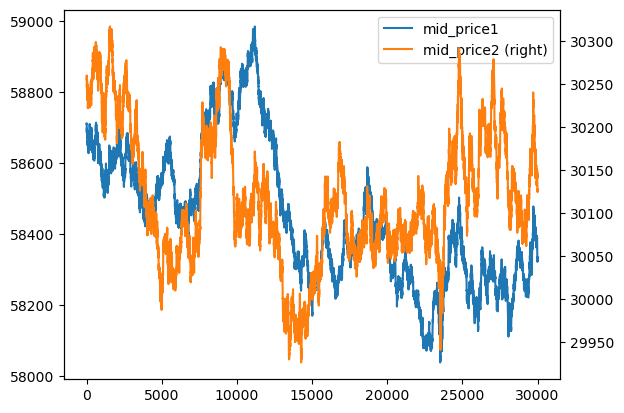

In [43]:
picnic_mids[["mid_price1", "mid_price2"]].plot(secondary_y="mid_price2")


In [44]:
forecast = np.zeros(len(picnic_mids))
x = picnic_mids[["mid_price1", "mid_price2"]].values
params = {
    "alpha": np.array([[-0.00019455], [0.00026457]]),
    "beta": np.array([[1.0, -1.94279816]]),
    "gamma": np.array(
        [[-0.03700845, -0.01196759], [-0.01018269, -0.0202882]],
    ),
}
p1 = np.zeros(len(picnic_mids))
p2 = np.zeros(len(picnic_mids))

for i in range(1, len(picnic_mids)):
    f1, f2 = params["alpha"] @ (params["beta"] @ x[i]) + params["gamma"] @ (
        x[i] - np.array(p1[i - 1], p2[i - 1])
    )
    p1[i] = f1 + x[i][0]
    p2[i] = f2 + x[i][1]


In [45]:
picnic_coin_vecm = coin_test(data, "PICNIC_BASKET1", "PICNIC_BASKET2")

 VECM Order Selection (* highlights the minimums) 
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0        4.701      4.703*       110.1       4.702
1        4.701       4.703       110.0       4.702
2        4.700       4.704       110.0       4.701
3        4.700       4.705       109.9      4.701*
4        4.700       4.706       109.9       4.702
5        4.700       4.707       109.9       4.702
6        4.700       4.708       109.9       4.702
7       4.699*       4.709      109.9*       4.702
8        4.700       4.710       109.9       4.703
9        4.700       4.712       109.9       4.704
10       4.700       4.713       109.9       4.704
--------------------------------------------------
Eigen statistic:
[0.00035021 0.00019383]
Critical values:
       90%      95%      99%
0  16.1619  18.3985  23.1485
1   2.7055   3.8415   6.6349

Trace statistic:
           0
0  16.322591
1   5.815159
Johansen cointegration test using

c:\Users\edmun\anaconda3\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results



Det. terms outside the coint. relation & lagged endog. parameters for equation mid_price_PICNIC_BASKET1
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
L1.mid_price_PICNIC_BASKET1    -0.0295      0.007     -4.529      0.000      -0.042      -0.017
L1.mid_price_PICNIC_BASKET2     0.0130      0.011      1.223      0.221      -0.008       0.034
Det. terms outside the coint. relation & lagged endog. parameters for equation mid_price_PICNIC_BASKET2
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
L1.mid_price_PICNIC_BASKET1    -0.0103      0.004     -2.595      0.009      -0.018      -0.003
L1.mid_price_PICNIC_BASKET2    -0.0038      0.007     -0.579      0.562      -0.017       0.009
      Loading coefficien

In [46]:
print(picnic_coin_vecm.alpha)
print()
print(picnic_coin_vecm.beta)
print()
print(picnic_coin_vecm.gamma)

[[-1.69860122e-04]
 [ 6.01499110e-05]]

[[ 1.        ]
 [-1.93982493]]

[[-0.0294737   0.01301372]
 [-0.01032964 -0.00376969]]


# CROISSANTS

In [47]:
c_vecm = coin_test(data, "CROISSANTS", "PICNIC_BASKET1")

 VECM Order Selection (* highlights the minimums) 
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0        1.047       1.049       2.850       1.048
1        1.026       1.029       2.790       1.027
2        1.024      1.028*       2.785      1.025*
3        1.024       1.029       2.784       1.025
4        1.024       1.030       2.784       1.026
5        1.024       1.031       2.784       1.026
6        1.024       1.032       2.784       1.026
7       1.024*       1.033      2.783*       1.027
8        1.024       1.034       2.784       1.027
9        1.024       1.036       2.784       1.028
10       1.024       1.037       2.784       1.028
--------------------------------------------------
Eigen statistic:
[2.56891227e-04 6.11471116e-05]
Critical values:
       90%      95%      99%
0  16.1619  18.3985  23.1485
1   2.7055   3.8415   6.6349

Trace statistic:
          0
0  9.541560
1  1.834347
Johansen cointegration test 

c:\Users\edmun\anaconda3\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results



Det. terms outside the coint. relation & lagged endog. parameters for equation mid_price_CROISSANTS
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
L1.mid_price_CROISSANTS        -0.1134      0.006    -18.461      0.000      -0.125      -0.101
L1.mid_price_PICNIC_BASKET1     0.0060      0.001     10.493      0.000       0.005       0.007
Det. terms outside the coint. relation & lagged endog. parameters for equation mid_price_PICNIC_BASKET1
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
L1.mid_price_CROISSANTS         0.5506      0.066      8.334      0.000       0.421       0.680
L1.mid_price_PICNIC_BASKET1    -0.0441      0.006     -7.149      0.000      -0.056      -0.032
        Loading coefficients

In [48]:
print(c_vecm.alpha)
print()
print(c_vecm.beta)
print()
print(c_vecm.gamma)

[[5.34423447e-06]
 [2.62015266e-03]]

[[ 1.        ]
 [-0.07299727]]

[[-0.11338856  0.00601765]
 [ 0.55056181 -0.04410077]]


# JAMS

In [49]:
j_vecm = coin_test(data, "JAMS", "PICNIC_BASKET1")

 VECM Order Selection (* highlights the minimums) 
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0        1.859       1.860       6.416       1.859
1        1.855      1.858*       6.392      1.856*
2        1.855       1.859       6.390       1.856
3       1.854*       1.859      6.388*       1.856
4        1.854       1.861       6.388       1.856
5        1.854       1.862       6.388       1.857
6        1.854       1.863       6.388       1.857
7        1.855       1.864       6.389       1.858
8        1.855       1.865       6.389       1.858
9        1.855       1.866       6.390       1.859
10       1.855       1.868       6.392       1.859
--------------------------------------------------
Eigen statistic:
[0.00030922 0.00010179]
Critical values:
       90%      95%      99%
0  16.1619  18.3985  23.1485
1   2.7055   3.8415   6.6349

Trace statistic:
           0
0  12.331198
1   3.053655
Johansen cointegration test using

c:\Users\edmun\anaconda3\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results



 Det. terms outside the coint. relation & lagged endog. parameters for equation mid_price_JAMS 
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
L1.mid_price_JAMS              -0.0235      0.006     -3.813      0.000      -0.036      -0.011
L1.mid_price_PICNIC_BASKET1     0.0040      0.001      4.711      0.000       0.002       0.006
Det. terms outside the coint. relation & lagged endog. parameters for equation mid_price_PICNIC_BASKET1
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
L1.mid_price_JAMS               0.2519      0.044      5.717      0.000       0.166       0.338
L1.mid_price_PICNIC_BASKET1    -0.0380      0.006     -6.172      0.000      -0.050      -0.026
           Loading coefficients 

In [50]:
print(j_vecm.alpha)
print()
print(j_vecm.beta)
print()
print(j_vecm.gamma)

[[-0.00025819]
 [ 0.00040967]]

[[ 1.        ]
 [-0.11123597]]

[[-0.0234515   0.00404433]
 [ 0.25186038 -0.03795187]]


# DJEMBES 

In [51]:
arma_order_select_ic(np.diff(dj), max_ar=2, max_ma=2)

{'bic':               0             1             2
 0  80118.026993  80101.488206  80096.870983
 1  80100.297803  80095.422753  80103.792323
 2  80096.029697  80103.828010  80114.511205,
 'bic_min_order': (1, 1)}

In [52]:
dj_vecm = coin_test(data, "DJEMBES", "PICNIC_BASKET1")

 VECM Order Selection (* highlights the minimums) 
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0        2.758       2.760       15.77       2.759
1        2.757      2.759*       15.75       2.757
2        2.756       2.760       15.74      2.757*
3       2.756*       2.761      15.73*       2.757
4        2.756       2.762       15.74       2.758
5        2.756       2.763       15.74       2.758
6        2.756       2.764       15.73       2.759
7        2.756       2.765       15.74       2.759
8        2.756       2.767       15.74       2.760
9        2.756       2.768       15.74       2.760
10       2.757       2.769       15.74       2.761
--------------------------------------------------
Eigen statistic:
[3.07628322e-04 9.29163433e-05]
Critical values:
       90%      95%      99%
0  16.1619  18.3985  23.1485
1   2.7055   3.8415   6.6349

Trace statistic:
           0
0  12.017088
1   2.787434
Johansen cointegration te

c:\Users\edmun\anaconda3\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results



Det. terms outside the coint. relation & lagged endog. parameters for equation mid_price_DJEMBES
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
L1.mid_price_DJEMBES            0.0285      0.006      4.844      0.000       0.017       0.040
L1.mid_price_PICNIC_BASKET1     0.0024      0.001      1.993      0.046       4e-05       0.005
Det. terms outside the coint. relation & lagged endog. parameters for equation mid_price_PICNIC_BASKET1
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
L1.mid_price_DJEMBES            0.0461      0.028      1.640      0.101      -0.009       0.101
L1.mid_price_PICNIC_BASKET1    -0.0275      0.006     -4.678      0.000      -0.039      -0.016
         Loading coefficients (

In [53]:
print(dj_vecm.alpha)
print()
print(dj_vecm.beta)
print()
print(dj_vecm.gamma)

[[-0.00024279]
 [ 0.00149003]]

[[ 1.        ]
 [-0.22843637]]

[[ 0.02846717  0.00244811]
 [ 0.04611551 -0.02749143]]


# VOLCANO

In [54]:
volcano = data[data["product"].str.contains("VOLCANIC")]

In [55]:
volcano.columns

Index(['day', 'timestamp', 'product', 'bid_price_1', 'bid_volume_1',
       'bid_price_2', 'bid_volume_2', 'bid_price_3', 'bid_volume_3',
       'ask_price_1', 'ask_volume_1', 'ask_price_2', 'ask_volume_2',
       'ask_price_3', 'ask_volume_3', 'mid_price', 'profit_and_loss', 'round',
       'most_bid_volume_idx', 'most_ask_volume_idx', 'most_bid_volume',
       'most_ask_volume', 'total_bid_volume', 'total_ask_volume',
       'volume_ratio', 'orderbook_imb', 'price_impact_sell',
       'price_impact_buy', 'rate_of_bid', 'rate_of_ask', 'most_bid',
       'most_ask', 'most_mid', 'most_micro', 'micro_price', 'ask_vwap',
       'bid_vwap', 'vwap_mid'],
      dtype='object')

In [56]:
vol_df = volcano.pivot(
    columns="product", values="mid_price", index=["day", "timestamp"]
)
vol_df = vol_df[
    [
        "VOLCANIC_ROCK",
        "VOLCANIC_ROCK_VOUCHER_9500",
        "VOLCANIC_ROCK_VOUCHER_9750",
        "VOLCANIC_ROCK_VOUCHER_10000",
        "VOLCANIC_ROCK_VOUCHER_10250",
        "VOLCANIC_ROCK_VOUCHER_10500",
    ]
]

In [57]:
payoff_df = vol_df.copy()

strike = [9500, 9750, 10000, 10250, 10500]

for s in strike:
    payoff_df[f"{s}_payoff"] = np.where(
        payoff_df["VOLCANIC_ROCK"] - s < 0, 0, payoff_df["VOLCANIC_ROCK"] - s
    )
    payoff_df[f"{s}_call_diff"] = (
        payoff_df[f"VOLCANIC_ROCK_VOUCHER_{s}"] - payoff_df[f"{s}_payoff"]
    )
    payoff_df[f"{s}_call_arb"] = np.where(
        payoff_df[f"VOLCANIC_ROCK_VOUCHER_{s}"] < payoff_df[f"{s}_payoff"], 1, 0
    )
    print(payoff_df[f"{s}_call_diff"].value_counts().sort_values().head(10))

for i in range(len(strike)):
    if strike[i] not in [9500, 10500]:
        print(strike[i])
        payoff_df[f"{strike[i]}_butterfly"] = -2 * payoff_df[
            f"VOLCANIC_ROCK_VOUCHER_{strike[i]}"
        ] + (
            payoff_df[f"VOLCANIC_ROCK_VOUCHER_{strike[i - 1]}"]
            + payoff_df[f"VOLCANIC_ROCK_VOUCHER_{strike[i + 1]}"]
        )
        payoff_df[f"{strike[i]}_butterfly_arb"] = np.where(
            payoff_df[f"{strike[i]}_butterfly"] < 0, 1, 0
        )

for i in range(len(strike)):
    for j in range(i + 1, len(strike)):
        payoff_df[f"{strike[i]}_{strike[j]}_bcp"] = (
            payoff_df[f"VOLCANIC_ROCK_VOUCHER_{strike[i]}"]
            - payoff_df[f"VOLCANIC_ROCK_VOUCHER_{strike[j]}"]
        )

        payoff_df[f"{strike[i]}_{strike[j]}_bcp_arb"] = np.where(
            payoff_df[f"{strike[i]}_{strike[j]}_bcp"] - (strike[j] - strike[i]) > 0,
            1,
            0,
        )

        print(strike[i], strike[j], payoff_df[f"{strike[i]}_{strike[j]}_bcp_arb"].sum())

9500_call_diff
-1.5        1
 3.0        7
-1.0       12
 2.5       33
 2.0      267
-0.5      429
 1.5      902
 1.0     3318
 0.0    11554
 0.5    13477
Name: count, dtype: int64
9750_call_diff
26.0     2
28.5     2
28.0     2
27.0     3
26.5     4
25.5     4
24.5     5
23.5     8
25.0     8
23.0    10
Name: count, dtype: int64
10000_call_diff
68.5     1
0.5      1
72.0     1
71.5     2
69.5     2
68.0     2
67.0     4
66.0     5
63.5     6
63.0    10
Name: count, dtype: int64
10250_call_diff
8.0     1
12.0    2
81.0    3
1.5     3
9.0     3
7.0     4
81.5    5
11.0    6
4.0     9
10.0    9
Name: count, dtype: int64
10500_call_diff
0.0     1
30.0    1
40.0    1
66.0    1
68.0    1
69.0    1
76.0    1
21.0    1
42.0    1
77.0    1
Name: count, dtype: int64
9750
10000
10250
9500 9750 3
9500 10000 0
9500 10250 0
9500 10500 0
9750 10000 0
9750 10250 0
9750 10500 0
10000 10250 0
10000 10500 0
10250 10500 0


<Axes: xlabel='day,timestamp'>

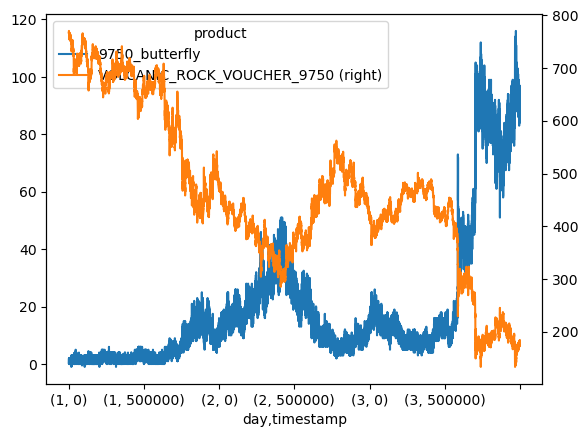

In [58]:
payoff_df[[f"{9750}_butterfly", "VOLCANIC_ROCK_VOUCHER_9750"]].plot(
    secondary_y="VOLCANIC_ROCK_VOUCHER_9750"
)

In [59]:
for s in strike:
    print(s)
    print(
        (
            payoff_df[f"VOLCANIC_ROCK_VOUCHER_{s}"] - payoff_df[f"{s}_payoff"]
        ).value_counts()
    )

9500
 0.5    13477
 0.0    11554
 1.0     3318
 1.5      902
-0.5      429
 2.0      267
 2.5       33
-1.0       12
 3.0        7
-1.5        1
Name: count, dtype: int64
9750
 1.0     6916
 0.5     6340
 1.5     3739
 2.0     2421
 2.5     1548
 0.0     1379
 3.0     1170
 3.5      866
 4.0      706
 4.5      542
 5.0      488
 5.5      365
 6.0      261
 13.0     171
 14.0     164
 15.0     161
 15.5     156
 13.5     147
 14.5     146
 10.0     140
 16.0     139
 12.0     134
 16.5     132
 6.5      124
 12.5     122
 17.0     122
 11.0     117
 11.5     117
 10.5     114
 9.0      108
 9.5      106
 7.0       98
 8.5       91
 17.5      77
 7.5       70
 8.0       70
 18.0      68
 18.5      54
 19.0      49
 19.5      39
 20.0      37
 21.0      31
-0.5       28
 22.5      20
 22.0      18
 20.5      17
 21.5      13
 24.0      11
 23.0      10
 25.0       8
 23.5       8
 24.5       5
 25.5       4
 26.5       4
 27.0       3
 28.0       2
 28.5       2
 26.0       2
Name: count,

In [60]:
payoff_df[payoff_df[f"{9500}_{9750}_bcp_arb"] == 1][f"{9500}_{9750}_bcp"].value_counts()

9500_9750_bcp
250.5    3
Name: count, dtype: int64

In [61]:
for i in range(len(strike)):
    if strike[i] not in [9500, 10500]:
        print(strike[i])
        print(payoff_df[f"{strike[i]}_butterfly_arb"].sum())

9750
6
10000
0
10250
0


<Axes: xlabel='day,timestamp'>

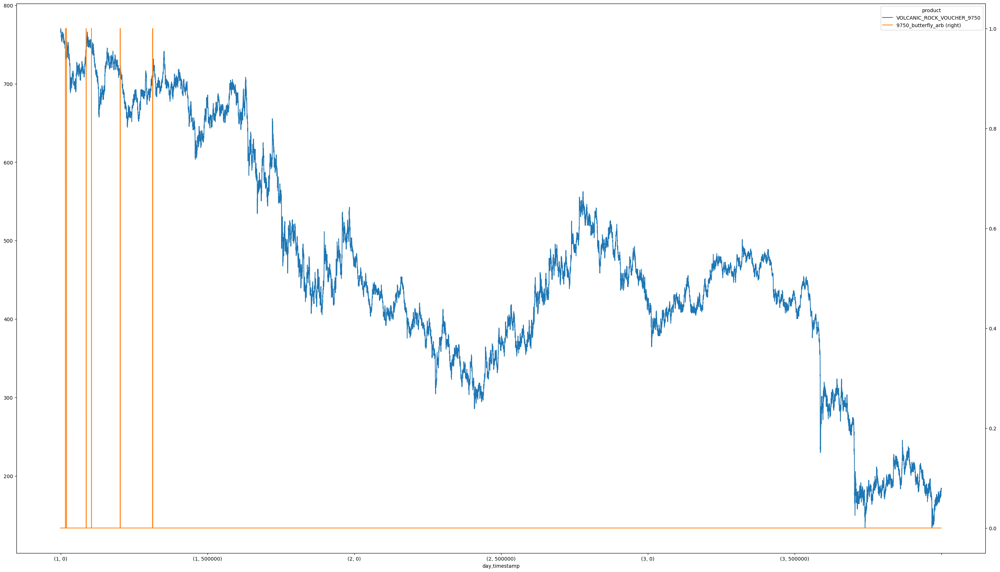

In [62]:
payoff_df[
    [
        # "VOLCANIC_ROCK",
        # "VOLCANIC_ROCK_VOUCHER_9500",
        "VOLCANIC_ROCK_VOUCHER_9750",
        # "VOLCANIC_ROCK_VOUCHER_10000",
        # "VOLCANIC_ROCK_VOUCHER_10250",
        # "VOLCANIC_ROCK_VOUCHER_10500",
        # "9500_payoff",
        # "9500_call_arb",
        # "9750_payoff",
        # "9750_call_arb",
        # "10000_payoff",
        # "10000_call_arb",
        # "10250_payoff",
        # "10250_call_arb",
        # "10500_payoff",
        # "10500_call_arb",
        # "9750_butterfly",
        "9750_butterfly_arb",
        # "10000_butterfly",
        # "10000_butterfly_arb",
        # "10250_butterfly",
        # "10250_butterfly_arb",
    ]
].plot(figsize=(35, 20), secondary_y="9750_butterfly_arb")

In [63]:
vol_df["rock_vol"] = payoff_df["VOLCANIC_ROCK"].pct_change().rolling(
    window=1000
).std() * np.sqrt(252e3)


<Axes: xlabel='day,timestamp'>

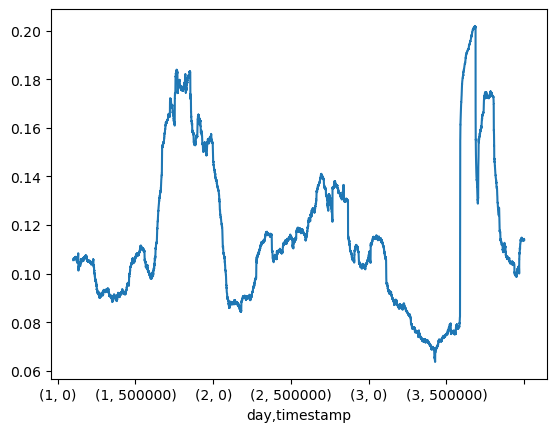

In [64]:
vol_df["rock_vol"].plot()

In [65]:
import math


def phi(x):
    return (1.0 + math.erf(x / np.sqrt(2.0))) / 2.0


def black_scholes_call(S, K, r, sigma, T):
    d1 = (np.log(S / K) + (r + sigma**2 / 2) * T) / (sigma * np.sqrt(T))
    d2 = d1 - sigma * np.sqrt(T)
    return S * phi(d1) - K * np.exp(-r * T) * phi(d2)


def call_delta(S, K, r, sigma, T):
    d1 = (np.log(S / K) + (r + sigma**2 / 2) * T) / (sigma * np.sqrt(T))
    return phi(d1)


def vega(S, K, r, sigma, T):
    d1 = (np.log(S / K) + (r + 0.5 * sigma**2) * T) / (sigma * np.sqrt(T))
    return S * np.exp(-0.5 * d1**2) / np.sqrt(2 * np.pi) * np.sqrt(T)


def solve_iv(call_price, S, K, r, T, initial_guess=0.2, max_iter=1000, tol=1e-6):
    solution = initial_guess
    for _ in range(max_iter):
        f_val = black_scholes_call(S, K, r, solution, T) - call_price
        f_prime_val = vega(S, K, r, solution, T)
        if abs(f_prime_val) < tol:
            break
        solution = solution - f_val / f_prime_val
        if abs(f_val) < tol:
            break
    return solution


In [66]:
(np.arange(len(vol_df)) * 100)

array([      0,     100,     200, ..., 2999700, 2999800, 2999900])

In [67]:
for i in strike:
    iv = []
    delta = []
    call_price = vol_df[f"VOLCANIC_ROCK_VOUCHER_{i}"].values
    s = vol_df["VOLCANIC_ROCK"].values
    r = (0,)
    T = (7e6 - (np.arange(len(vol_df)) * 100)) / 252e6
    for j in range(len(vol_df)):
        iv.append(solve_iv(call_price=call_price[j], S=s[j], K=i, r=0, T=T[j]))
        delta.append(call_delta(S=s[j], K=i, r=0, sigma=iv[-1], T=T[j]))
    vol_df[f"{i}_delta"] = delta
    vol_df[f"{i}_iv"] = iv
    vol_df[f"{i}_iv"] = np.where(
        vol_df[f"{i}_iv"] < 0,
        0.2,
        np.where(vol_df[f"{i}_iv"] > 1, 0.2, vol_df[f"{i}_iv"]),
    )

<Axes: xlabel='day,timestamp'>

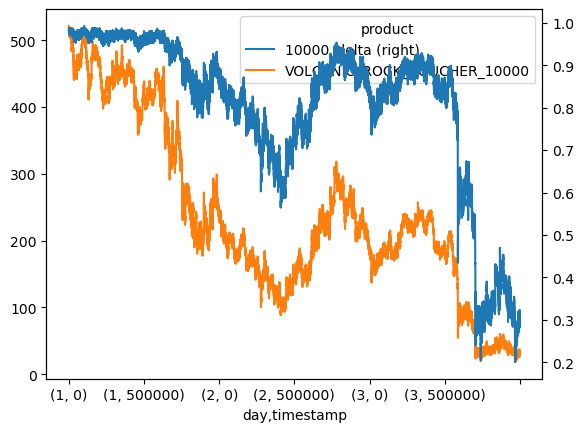

In [68]:
vol_df[["10000_delta", "VOLCANIC_ROCK_VOUCHER_10000"]].plot(secondary_y="10000_delta")

In [69]:
vol_df["time_to_expiry"] = (7e6 - (np.arange(len(vol_df)) * 100)) / 252e6
for i in strike:
    vol_df[f"mt_{i}"] = (
        np.log(i / vol_df[f"VOLCANIC_ROCK_VOUCHER_{i}"]) / vol_df["time_to_expiry"]
    )

In [70]:
vol_df.columns

Index(['VOLCANIC_ROCK', 'VOLCANIC_ROCK_VOUCHER_9500',
       'VOLCANIC_ROCK_VOUCHER_9750', 'VOLCANIC_ROCK_VOUCHER_10000',
       'VOLCANIC_ROCK_VOUCHER_10250', 'VOLCANIC_ROCK_VOUCHER_10500',
       'rock_vol', '9500_delta', '9500_iv', '9750_delta', '9750_iv',
       '10000_delta', '10000_iv', '10250_delta', '10250_iv', '10500_delta',
       '10500_iv', 'time_to_expiry', 'mt_9500', 'mt_9750', 'mt_10000',
       'mt_10250', 'mt_10500'],
      dtype='object', name='product')

In [73]:
vol_df

product        VOLCANIC_ROCK  VOLCANIC_ROCK_VOUCHER_9500  \
day timestamp                                              
1   0                10516.0                      1016.0   
    100              10515.0                      1015.5   
    200              10515.0                      1015.5   
    300              10517.0                      1017.5   
    400              10519.5                      1019.5   
...                      ...                         ...   
3   999500            9916.0                       417.5   
    999600            9917.0                       418.5   
    999700            9917.5                       419.5   
    999800            9919.0                       420.0   
    999900            9920.5                       421.5   

product        VOLCANIC_ROCK_VOUCHER_9750  VOLCANIC_ROCK_VOUCHER_10000  \
day timestamp                                                            
1   0                               766.5                        517.5   
    100                             765.5                        516.5   
    200                             765.5                        516.5   
    300                             767.5                        519.5   
    400                             770.5                        521.5   
...                                   ...                          ...   
3   999500                          181.5                         34.5   
    999600                          182.5                         30.5   
    999700                          182.5                         34.5   
    999800                          184.5                         33.5   
    999900                          183.5                         33.5   

product        VOLCANIC_ROCK_VOUCHER_10250  VOLCANIC_ROCK_VOUCHER_10500  \
day timestamp                                                             
1   0                                279.5                         95.5   
    100                              278.5                         94.5   
    200                              278.5                         94.5   
    300                              280.5                         95.5   
    400                              282.5                         97.5   
...                                    ...                          ...   
3   999500                             2.5                          1.0   
    999600                             2.5                          1.0   
    999700                             2.5                          1.0   
    999800                             2.5                          1.0   
    999900                             2.5                          1.0   

product        rock_vol  9500_delta   9500_iv  9750_delta  ...  10250_delta  \
day timestamp                                              ...                
1   0               NaN    1.000000  0.108308    0.994960  ...     0.881486   
    100             NaN    0.996051  0.230959    0.994955  ...     0.881221   
    200             NaN    0.996051  0.230960    0.994955  ...     0.881221   
    300             NaN    0.996058  0.231347    0.994966  ...     0.881749   
    400             NaN    1.000000  0.108552    0.991249  ...     0.884939   
...                 ...         ...       ...         ...  ...          ...   
3   999500     0.114136    0.980374  0.165840    0.833880  ...     0.035173   
    999600     0.114136    0.980410  0.166172    0.834401  ...     0.035247   
    999700     0.114115    0.975741  0.174001    0.837417  ...     0.035284   
    999800     0.114139    0.985668  0.157272    0.835432  ...     0.035396   
    999900     0.113935    0.985709  0.157747    0.850590  ...     0.035508   

product        10250_iv  10500_delta  10500_iv  time_to_expiry     mt_9500  \
day timestamp                                                                
1   0          0.131216     0.533294  0.124904        0.027778   80.475064   
    100        0.1

In [ ]:
win_y = np.clip(
    vol_df[
        [
            "9500_iv",
            "9750_iv",
            "10000_iv",
            "10250_iv",
            "10500_iv",
        ]
    ].values.flatten(),
    np.percentile(
        vol_df[
            [
                "9500_iv",
                "9750_iv",
                "10000_iv",
                "10250_iv",
                "10500_iv",
            ]
        ].values.flatten(),
        10,
    ),
    np.percentile(
        vol_df[
            [
                "9500_iv",
                "9750_iv",
                "10000_iv",
                "10250_iv",
                "10500_iv",
            ]
        ].values.flatten(),
        90,
    ),
)

In [92]:
px.scatter(
    x=vol_df[
        ["mt_9500", "mt_9750", "mt_10000", "mt_10250", "mt_10500"]
    ].values.flatten(),
    y=win_y,
)

# MAGNIFICENT_MACARONS

In [5]:
mac = data[data["product"] == "MAGNIFICENT_MACARONS"]

In [6]:
obs = []
for round, days in dates.items():
    for day in days:
        data = pd.read_csv(
            f"C:/Users/edmun/OneDrive/Desktop/2025-IMC-Global-Trading-Challenge/prosperity3bt/resources/round{round}/observations_round_{round}_day_{day}.csv",
        )
        data["round"] = round
        data["day"] = day

        obs.append(data)

obs = pd.concat(obs)

In [7]:
obs

,timestamp,bidPrice,askPrice,transportFees,exportTariff,importTariff,sugarPrice,sunlightIndex,round,day
0,0,627.0,628.5,1.0,9.0,-3.0,200.000000,60.00,4,1
1,100,630.0,631.5,1.0,9.0,-3.0,200.098445,60.00,4,1
2,200,630.0,631.5,1.0,9.0,-3.0,200.103915,60.00,4,1
3,300,632.0,633.5,1.0,9.0,-3.0,200.352462,60.01,4,1
4,400,630.5,632.0,1.0,9.0,-3.0,200.201545,60.01,4,1
...,...,...,...,...,...,...,...,...,...,...
9995,999500,797.5,799.0,1.7,9.5,-5.5,212.124918,54.95,4,3
9996,999600,801.5,803.0,1.7,9.5,-5.5,212.147650,54.96,4,3
9997,999700,804.0,805.5,1.7,9.5,-5.5,212.202086,54.97,4,3
9998,999800,798.5,800.0,1.7,9.5,-5.5,212.112734,54.98,4,3


In [8]:
mac_obs = pd.merge(
    mac, obs, how="inner", left_on=["day", "timestamp"], right_on=["day", "timestamp"]
)

In [21]:
mac_obs["f_mid_price"] = (
    (mac_obs["bidPrice"] - mac_obs["transportFees"] - mac_obs["exportTariff"])
    + (mac_obs["askPrice"] + mac_obs["transportFees"] + mac_obs["importTariff"])
) / 2

In [24]:
mac_vecm = VECM(
    endog=mac_obs[["sugarPrice", "sunlightIndex", ]],
    # exog=mac_obs[["sugarPrice", "sunlightIndex"]],
    k_ar_diff=1,
    coint_rank=1,
).fit()

print(mac_vecm.summary())

Det. terms outside the coint. relation & lagged endog. parameters for equation sugarPrice
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
L1.sugarPrice       -0.0014      0.006     -0.250      0.802      -0.013       0.010
L1.sunlightIndex    -0.1818      0.097     -1.869      0.062      -0.373       0.009
Det. terms outside the coint. relation & lagged endog. parameters for equation sunlightIndex
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
L1.sugarPrice        0.0001      0.000      0.802      0.423      -0.000       0.001
L1.sunlightIndex     0.8461      0.003    274.860      0.000       0.840       0.852
             Loading coefficients (alpha) for equation sugarPrice             
                 coef    std err          z      P>|z|    

In [24]:
print(mac_vecm.alpha)
print()
print(mac_vecm.beta)
print()
print(mac_vecm.gamma)

[[-1.52993775e-01]
 [ 8.15420486e-05]
 [ 4.11751374e-02]]

[[ 1.        ]
 [-0.01801571]
 [-1.00898566]]

[[-4.49306958e-01 -2.96229259e+00  4.48566308e-01]
 [ 5.57841018e-05  8.46368308e-01 -5.26425596e-05]
 [-4.56641755e-02 -3.57708788e+00  4.45664533e-02]]


In [ ]:
mac_vecm.predict(steps=1)

array([[798.05623869, 212.17038749,  54.99818443]])

In [ ]:
class V:
    def __init__(self, endog):
        self.y = endog.T
        self.k_ar_diff = 1
        self.coint_rank = 1

    def _sij(self, delta_x, delta_y_1_T, y_lag1):
        nobs = y_lag1.shape[1]
        r0, r1 = self._r_matrices(delta_y_1_T, y_lag1, delta_x)

        if r0 is None:
            return None, None, None, None, None, None, None

        s00 = np.dot(r0, r0.T) / nobs
        s01 = np.dot(r0, r1.T) / nobs
        s10 = s01.T
        s11 = np.dot(r1, r1.T) / nobs

        if np.linalg.det(self._mat_sqrt(s11)) == 0:
            return None, None, None, None, None, None, None

        s11_ = np.linalg.inv(self._mat_sqrt(s11))
        s01_s11_ = np.dot(s01, s11_)

        if np.linalg.det(s00) == 0:
            return None, None, None, None, None, None, None
        elif np.linalg.det(s01_s11_.T @ np.linalg.inv(s00) @ s01_s11_) == 0:
            return None, None, None, None, None, None, None

        eig = np.linalg.eig(s01_s11_.T @ np.linalg.inv(s00) @ s01_s11_)
        lambd = eig[0]
        v = eig[1]
        lambd_order = np.argsort(lambd)[::-1]
        lambd = lambd[lambd_order]
        v = v[:, lambd_order]
        return s00, s01, s10, s11, s11_, lambd, v

    def _mat_sqrt(self, _2darray):
        u_, s_, v_ = np.linalg.svd(_2darray, full_matrices=False)
        s_ = np.sqrt(s_)
        return u_.dot(s_[:, None] * v_)

    def _r_matrices(self, delta_y_1_T, y_lag1, delta_x):
        if np.linalg.det(delta_x.dot(delta_x.T)) == 0:
            return None, None
        nobs = y_lag1.shape[1]
        m = np.identity(nobs) - (
            delta_x.T.dot(np.linalg.inv(delta_x.dot(delta_x.T))).dot(delta_x)
        )
        r0 = delta_y_1_T.dot(m)
        r1 = y_lag1.dot(m)
        return r0, r1

    def _endog_matrices(
        self,
        endog,
        diff_lags,
    ):
        p = diff_lags + 1
        y = endog
        K = y.shape[0]
        y_1_T = y[:, p:]
        T = y_1_T.shape[1]
        delta_y = np.diff(y)
        delta_y_1_T = delta_y[:, p - 1 :]

        y_lag1 = y[:, p - 1 : -1]
        y_lag1_stack = [y_lag1]
        y_lag1 = np.row_stack(y_lag1_stack)

        delta_x = np.zeros((diff_lags * K, T))
        if diff_lags > 0:
            for j in range(delta_x.shape[1]):
                delta_x[:, j] = delta_y[
                    :, j + p - 2 : None if j - 1 < 0 else j - 1 : -1
                ].T.reshape(K * (p - 1))
        delta_x_stack = [delta_x]
        delta_x = np.row_stack(delta_x_stack)

        return y_1_T, delta_y_1_T, y_lag1, delta_x

    def _estimate_vecm_ml(self):
        y_1_T, delta_y_1_T, y_lag1, delta_x = self._endog_matrices(
            self.y,
            self.k_ar_diff,
        )

        _, s01, _, s11, s11_, _, v = self._sij(delta_x, delta_y_1_T, y_lag1)

        if any([i is None for i in [_, s01, _, s11, s11_, _, v]]):
            return None, None, None

        beta_tilde = (v[:, : self.coint_rank].T.dot(s11_)).T
        beta_tilde = np.real_if_close(beta_tilde)
        beta_tilde = np.dot(beta_tilde, np.linalg.inv(beta_tilde[: self.coint_rank]))
        alpha_tilde = s01.dot(beta_tilde).dot(
            np.linalg.inv(beta_tilde.T.dot(s11).dot(beta_tilde))
        )
        gamma_tilde = (
            (delta_y_1_T - alpha_tilde.dot(beta_tilde.T).dot(y_lag1))
            .dot(delta_x.T)
            .dot(np.linalg.inv(np.dot(delta_x, delta_x.T)))
        )

        return alpha_tilde, beta_tilde, gamma_tilde

In [ ]:
def VECM_MACAROONS(mid, sugar, sunlight, mid_cache, sugar_cache, sunlight_cache):
    most_mid_price = np.array([mid, sugar, sunlight])

    mids = np.array(
        [
            np.array(mid_cache),
            np.array(sugar_cache),
            np.array(sunlight_cache),
        ]
    ).T

    vecm_model = V(endog=mids)
    alpha, beta, gamma = vecm_model._estimate_vecm_ml()
    if alpha is None or beta is None or gamma is None:
        return 0, 0
    beta = beta.T

    prev_mid = np.array(
        [
            mid_cache[-1],
            sugar_cache[-1],
            sunlight_cache[-1],
        ]
    )

    delta = VECM(
        alpha=alpha,
        beta=beta,
        gamma=gamma,
        current_price=most_mid_price,
        prev_mid=prev_mid,
    )

    prod_1_forecast = mid + delta[0]

    return delta[0], prod_1_forecast


def VECM(alpha, beta, gamma, current_price, prev_mid):
    return alpha @ (beta @ current_price) + gamma @ (current_price - prev_mid)

In [ ]:
m = mac_obs["mid_price"].values
s = mac_obs["sugarPrice"].values
sl = mac_obs["sunlightIndex"].values

In [ ]:
d = []
for i in range(200, len(mac_obs)):
    delta, forecast = VECM_MACAROONS(
        mid=m[i],
        sugar=s[i],
        sunlight=sl[i],
        mid_cache=m[i - 200 : i],
        sugar_cache=s[i - 200 : i],
        sunlight_cache=sl[i - 200 : i],
    )
    d.append(delta)

In [ ]:
d_roll = []
for i in range(200, len(d)):
    k = d[i - 200 : i]
    d_roll.append((d[i] - np.mean(k)) / np.std(k))

C:\Users\edmun\AppData\Local\Temp\ipykernel_14480\199319443.py:4: RuntimeWarning:

invalid value encountered in scalar divide

C:\Users\edmun\AppData\Local\Temp\ipykernel_14480\199319443.py:4: RuntimeWarning:

divide by zero encountered in scalar divide



In [ ]:
pd.DataFrame(d_roll).dropna().describe()

,0
count,2.739400e+04
mean,-inf
std,NaN
min,-inf
25%,-6.409460e-01
50%,2.084254e-02
75%,6.385669e-01
max,3.159272e+02


In [ ]:
px.histogram(d_roll)